<a href="https://colab.research.google.com/github/Prathambiradr12345/Machine-_learning/blob/main/Question_No_02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd

# Step 1: Load the Titanic dataset

titanic_data = pd.read_csv('tested.csv')

# Step 2: Create a Multi-Index DataFrame
# Set Pclass and Survived as a hierarchical index
titanic_multi_index = titanic_data.set_index(['Pclass', 'Survived'])

# Display the first few rows of the multi-index DataFrame
print("Multi-Index DataFrame:")
titanic_multi_index.head()

# Step 3: Perform Operations

# 3.1: Group by the multi-index and get counts
grouped_counts = titanic_multi_index.groupby(level=[0, 1]).size()
print("\nCounts of passengers by class and survival status:")
print(grouped_counts)

# 3.2: Aggregating data to find average age and fare by class and survival status
avg_age_fare = titanic_multi_index.groupby(level=[0, 1]).agg({'Age': 'mean', 'Fare': 'mean'})
print("\nAverage Age and Fare by class and survival status:")
avg_age_fare

# 3.3: Querying specific levels of the index
# For example, get data for 1st class passengers
first_class_data = titanic_multi_index.loc[1]
print("\nData for 1st class passengers:")
print(first_class_data)

# 3.4: Reset the index to flatten the DataFrame
flattened_df = titanic_multi_index.reset_index()
print("\nFlattened DataFrame:")
flattened_df.head()


Multi-Index DataFrame:

Counts of passengers by class and survival status:
Pclass  Survived
1       0            57
        1            50
2       0            63
        1            30
3       0           146
        1            72
dtype: int64

Average Age and Fare by class and survival status:

Data for 1st class passengers:
          PassengerId                                               Name  \
Survived                                                                   
0                 903                         Jones, Mr. Charles Cresson   
1                 904      Snyder, Mrs. John Pillsbury (Nelle Stevenson)   
1                 906  Chaffee, Mrs. Herbert Fuller (Carrie Constance...   
0                 912                             Rothschild, Mr. Martin   
1                 914               Flegenheim, Mrs. Alfred (Antoinette)   
...               ...                                                ...   
0                1295                             Carrau, M

,Pclass,Survived,PassengerId,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,3,0,892,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,NaN,Q
1,3,1,893,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,363272,7.0000,NaN,S
2,2,0,894,"Myles, Mr. Thomas Francis",male,62.0,0,0,240276,9.6875,NaN,Q
3,3,0,895,"Wirz, Mr. Albert",male,27.0,0,0,315154,8.6625,NaN,S
4,3,1,896,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22.0,1,1,3101298,12.2875,NaN,S


In [ ]:
import pandas as pd


titanic_df = pd.read_csv('tested.csv')


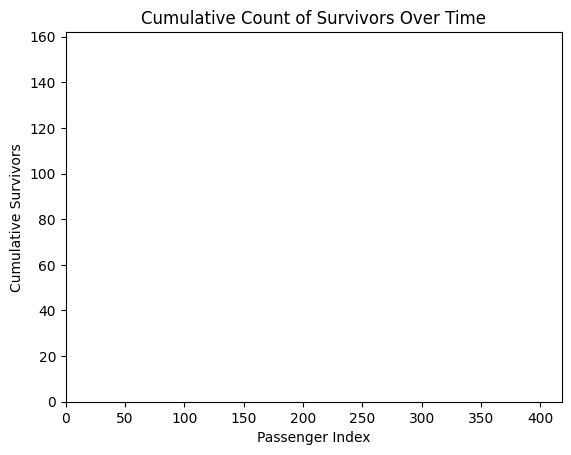

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Prepare the data by calculating cumulative survivors
titanic_df['Cumulative_Survivors'] = titanic_df['Survived'].cumsum()

# Set up the figure and axis for the plot
fig, ax = plt.subplots()
ax.set_xlim(0, len(titanic_df))
ax.set_ylim(0, titanic_df['Cumulative_Survivors'].max() + 10)
line, = ax.plot([], [], color='blue', lw=2)

# Initialize function for animation
def init():
    line.set_data([], [])
    return line,

# Update function for animation
def update(frame):
    x = range(frame)
    y = titanic_df['Cumulative_Survivors'].iloc[:frame]
    line.set_data(x, y)
    return line,

# Create the animation
ani = FuncAnimation(fig, update, frames=len(titanic_df), init_func=init, blit=True)
plt.title('Cumulative Count of Survivors Over Time')
plt.xlabel('Passenger Index')
plt.ylabel('Cumulative Survivors')
plt.show()


IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

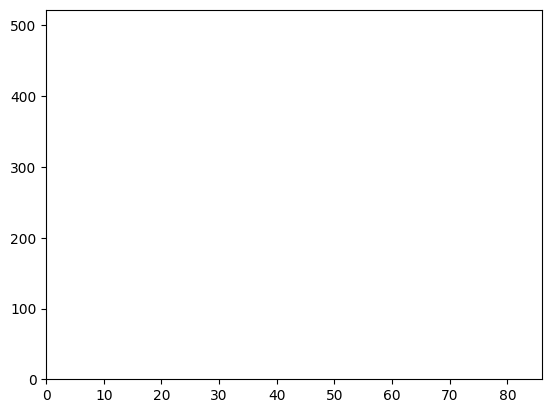

In [ ]:
import numpy as np

# Set up the figure and axis for the scatter plot
fig, ax = plt.subplots()
ax.set_xlim(0, titanic_df['Age'].max() + 10)
ax.set_ylim(0, titanic_df['Fare'].max() + 10)
scatter = ax.scatter([], [], c=[], cmap='viridis', alpha=0.6)

# Initialize function for animation
def init():
    scatter.set_offsets([])
    return scatter,

# Update function for animation
def update(frame):
    data = titanic_df.iloc[:frame]
    x = data['Age']
    y = data['Fare']
    colors = data['Pclass']
    scatter.set_offsets(np.c_[x, y])
    scatter.set_array(colors)
    return scatter,

# Create the animation
ani = FuncAnimation(fig, update, frames=len(titanic_df), init_func=init, blit=True)
plt.title('Age vs. Fare by Passenger Class')
plt.xlabel('Age')
plt.ylabel('Fare')
plt.show()


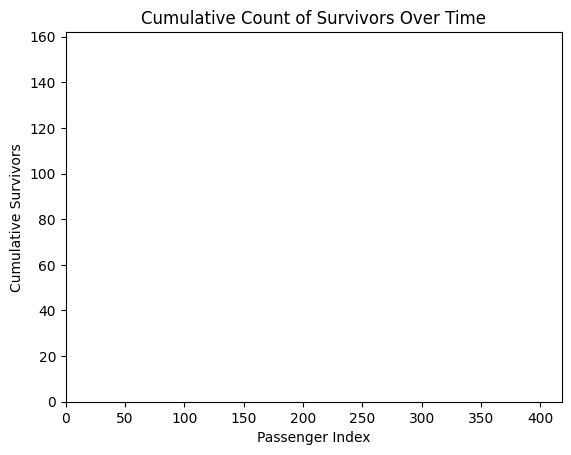

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Load the Titanic dataset
titanic_df = pd.read_csv('tested.csv')  # Ensure the correct path to your CSV file

# Prepare cumulative survivors data
titanic_df['Cumulative_Survivors'] = titanic_df['Survived'].cumsum()

# Set up the figure and axis for the plot
fig, ax = plt.subplots()
ax.set_xlim(0, len(titanic_df))
ax.set_ylim(0, titanic_df['Cumulative_Survivors'].max() + 10)
line, = ax.plot([], [], color='blue', lw=2)

# Initialize the plot
def init():
    line.set_data([], [])
    return line,

# Update function for the animation
def update(frame):
    x = range(frame)
    y = titanic_df['Cumulative_Survivors'].iloc[:frame]
    line.set_data(x, y)
    return line,

# Create and display the animation
ani = FuncAnimation(fig, update, frames=len(titanic_df) + 1, init_func=init, blit=True)
plt.title('Cumulative Count of Survivors Over Time')
plt.xlabel('Passenger Index')
plt.ylabel('Cumulative Survivors')
plt.show()

In [ ]:
import matplotlib
matplotlib.use('TkAgg')  # Add this line

import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Load the Titanic dataset
titanic_df = pd.read_csv('tested.csv')

# Verify data is loaded correctly
print("Data shape:", titanic_df.shape)
print("Columns:", titanic_df.columns)

# Ensure 'Survived' column exists and contains numeric values
titanic_df['Survived'] = pd.to_numeric(titanic_df['Survived'], errors='coerce')

# Prepare cumulative survivors data
titanic_df['Cumulative_Survivors'] = titanic_df['Survived'].cumsum()

# Set up the figure and axis for the plot
fig, ax = plt.subplots(figsize=(10, 6))  # Specify figure size
ax.set_xlim(0, len(titanic_df))
ax.set_ylim(0, titanic_df['Cumulative_Survivors'].max() + 10)
line, = ax.plot([], [], color='blue', lw=2)

# Initialize the plot
def init():
    line.set_data([], [])
    return line,

# Update function for the animation
def update(frame):
    x = list(range(frame))
    y = titanic_df['Cumulative_Survivors'].iloc[:frame].tolist()
    line.set_data(x, y)
    return line,

# Create and display the animation
ani = FuncAnimation(fig, update, frames=len(titanic_df) + 1,
                   init_func=init, blit=True, interval=50)  # Added interval

plt.title('Cumulative Count of Survivors Over Time')
plt.xlabel('Passenger Index')
plt.ylabel('Cumulative Survivors')
plt.grid(True)  # Add grid for better visibility

# Show the plot
plt.show()

ImportError: Cannot load backend 'TkAgg' which requires the 'tk' interactive framework, as 'headless' is currently running

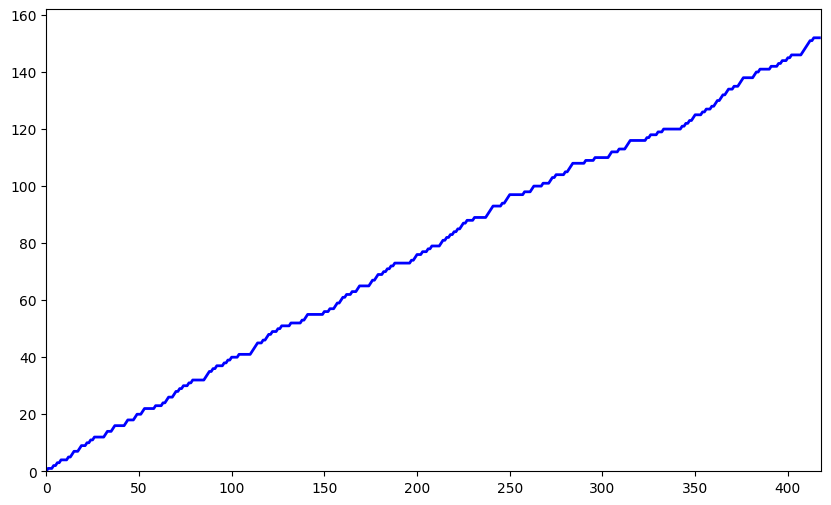

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Load the Titanic dataset
titanic_df = pd.read_csv('tested.csv')

# Ensure 'Survived' column exists and contains numeric values
titanic_df['Survived'] = pd.to_numeric(titanic_df['Survived'], errors='coerce')

# Prepare cumulative survivors data
titanic_df['Cumulative_Survivors'] = titanic_df['Survived'].cumsum()

# Set up the figure and axis for the plot
fig, ax = plt.subplots(figsize=(10, 6))  # Specify figure size
ax.set_xlim(0, len(titanic_df))
ax.set_ylim(0, titanic_df['Cumulative_Survivors'].max() + 10)
line, = ax.plot([], [], color='blue', lw=2)

# Initialize the plot
def init():
    line.set_data([], [])
    return line,

# Update function for the animation
def update(frame):
    x = list(range(frame))
    y = titanic_df['Cumulative_Survivors'].iloc[:frame].tolist()
    line.set_data(x, y)
    return line,

# Create the animation
ani = FuncAnimation(fig, update, frames=len(titanic_df) + 1, init_func=init, blit=True, interval=50)

# Display the animation as HTML video
HTML(ani.to_jshtml())
